# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

## Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

### Background
The client is a used car dealership, with an interest in better understanding what is important to a buyer, in order to better inform pricing and promotion.

### Business Objectives
Since we can't actually interview the client, here are some of the possible business objectives which this effort might achieve.
1. Sell more cars
2. Sell cars more quickly to reduce lot inventory costs and depreciation
3. Increase profit margin on sale
4. Decrease cost of purchase
5. Improve promotion effectiveness by advertising what buyers are looking for.
6. Improve customer satisfaction
7. Improve retention / repeat buyers
8. Increase sales agent productivity / retention

### Business success criteria
Possible metrics and goals associated with each business objective
1. Increase total #cars sold
2. Decrease average time on lot
3. Increase average profit per sale
4. Decrease average purchase price on intake
5. Improve promotional effectiveness (channel dependent metric)
6. Increase post sale customer satisfaction at +1 week, +1 month, +1 year
7. Increase percentage of buyers who repeat
8. Increase average revenue / profit / commission per agent.  Increase average agent tenure



## Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

### Data Objectives derived from Business Understanding

1. Determine the relative importance of factors (columns) affecting the prices of used cars in the USA.
2. Examine regional variation.  Develop hypotheses about any subsetting necessary to restrict the training set to increase relevance for this client.
2. Build and test models which can be used to predict the price of additional cars given the named factors.
3. Use the best predictive models to build hypotheses about consumer prefences.

### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

### Data Preparation / Inspection
1. Inspect the data.  Look for completeness of the dataset.  
2. Fill in or drop data as needed to create consistency for data analysis
3. Remove redundant columns
4. Encode categorical columns to enable numeric analysis
5. Apply any needed subsetting to use only relevant data
6. Determine cross-validation strategy and create training / test subsets

In [13]:
# import the necessary packages
from statsmodels.tsa.seasonal import seasonal_decompose

import statsmodels.api as sm
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.filters.filtertools import convolution_filter
import statsmodels.graphics.tsaplots as tsaplots
from statsmodels.tsa.seasonal import _extrapolate_trend
from sklearn.linear_model import LinearRegression

In [25]:
# load the data
df = pd.read_csv('data/vehicles.csv')

In [26]:
df

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426875,7301591192,wyoming,23590,2019.0,nissan,maxima s sedan 4d,good,6 cylinders,gas,32226.0,clean,other,1N4AA6AV6KC367801,fwd,NaN,sedan,NaN,wy
426876,7301591187,wyoming,30590,2020.0,volvo,s60 t5 momentum sedan 4d,good,NaN,gas,12029.0,clean,other,7JR102FKXLG042696,fwd,NaN,sedan,red,wy
426877,7301591147,wyoming,34990,2020.0,cadillac,xt4 sport suv 4d,good,NaN,diesel,4174.0,clean,other,1GYFZFR46LF088296,NaN,NaN,hatchback,white,wy
426878,7301591140,wyoming,28990,2018.0,lexus,es 350 sedan 4d,good,6 cylinders,gas,30112.0,clean,other,58ABK1GG4JU103853,fwd,NaN,sedan,silver,wy


In [16]:
#describe the data
df.describe()

,id,price,year,odometer
count,4.268800e+05,4.268800e+05,425675.000000,4.224800e+05
mean,7.311487e+09,7.519903e+04,2011.235191,9.804333e+04
std,4.473170e+06,1.218228e+07,9.452120,2.138815e+05
min,7.207408e+09,0.000000e+00,1900.000000,0.000000e+00
25%,7.308143e+09,5.900000e+03,2008.000000,3.770400e+04
50%,7.312621e+09,1.395000e+04,2013.000000,8.554800e+04
75%,7.315254e+09,2.648575e+04,2017.000000,1.335425e+05
max,7.317101e+09,3.736929e+09,2022.000000,1.000000e+07


In [17]:
#count the number of missing values in the dataset
df.isnull().sum()


id                   0
region               0
price                0
year              1205
manufacturer     17646
model             5277
condition       174104
cylinders       177678
fuel              3013
odometer          4400
title_status      8242
transmission      2556
VIN             161042
drive           130567
size            306361
type             92858
paint_color     130203
state                0
dtype: int64

In [27]:
# conside dropping the rows with missing values
df_nonull = df.dropna()
lost_rows = df.count().max() - df_nonull.count().max()
print(f"Lost rows: {lost_rows}")
print(f"resulting rows: {df_nonull.count().max()}")

Lost rows: 392012
resulting rows: 34868


In [113]:
# get the count of rows with 'price' equal to 0
zero_price_rows = df_nonull[df_nonull['price'] == 0].count().max()
print(f"Rows with price = 0: {zero_price_rows}")

# drop the rows with 'price' equal to 0
df_nonull = df_nonull[df_nonull['price'] != 0]
print(f"resulting rows: {df_nonull.count().max()}")


Rows with price = 0: 2372
resulting rows: 32496


### Data subset

Although this is a significant reduction in the size of the dataset, 32k records should still be enough to form a representative subset.  If the data looks skewed, I may have to come back and revisit this.

## Redundant Columns

In [114]:
print(df_nonull.info())
df_nonull


<class 'pandas.core.frame.DataFrame'>
Index: 32496 entries, 215 to 426833
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   id                32496 non-null  int64   
 1   region            32496 non-null  object  
 2   price             32496 non-null  int64   
 3   year              32496 non-null  int64   
 4   manufacturer      32496 non-null  category
 5   model             32496 non-null  object  
 6   condition         32496 non-null  category
 7   cylinders         32496 non-null  object  
 8   fuel              32496 non-null  object  
 9   odometer          32496 non-null  float64 
 10  title_status      32496 non-null  object  
 11  transmission      32496 non-null  object  
 12  VIN               32496 non-null  object  
 13  drive             32496 non-null  object  
 14  size              32496 non-null  object  
 15  type              32496 non-null  object  
 16  paint_color       32496 

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,...,drive,size,type,paint_color,state,mfr_encode,num_cyl,condition_encode,color_encode,year_group
215,7316482063,birmingham,4000,2002,toyota,echo,excellent,4 cylinders,gas,155000.0,...,fwd,compact,sedan,blue,al,38,4.0,0,1,"(2000.0, 2005.0]"
219,7316429417,birmingham,2500,1995,bmw,525i,fair,6 cylinders,gas,110661.0,...,rwd,mid-size,sedan,white,al,4,6.0,1,10,"(1990.0, 1995.0]"
268,7315946365,birmingham,9000,2008,mazda,miata mx-5,excellent,4 cylinders,gas,56700.0,...,rwd,compact,convertible,white,al,25,4.0,0,10,"(2005.0, 2010.0]"
337,7315354216,birmingham,8950,2011,ford,f-150,excellent,6 cylinders,gas,164000.0,...,fwd,full-size,truck,white,al,13,6.0,0,10,"(2010.0, 2015.0]"
338,7315349921,birmingham,4000,1972,mercedes-benz,benz,fair,6 cylinders,gas,88100.0,...,rwd,full-size,coupe,silver,al,26,6.0,1,9,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426785,7303314912,wyoming,23495,2015,ford,f150 xlt 4x4,like new,8 cylinders,gas,146795.0,...,4wd,full-size,truck,black,wy,13,8.0,3,0,"(2010.0, 2015.0]"
426788,7303227528,wyoming,12995,2016,chevrolet,cruze lt,like new,4 cylinders,gas,61127.0,...,fwd,compact,sedan,silver,wy,7,4.0,3,9,"(2015.0, 2020.0]"
426792,7303114896,wyoming,32999,2014,ford,"f350, xlt",excellent,8 cylinders,diesel,154642.0,...,4wd,full-size,pickup,brown,wy,13,8.0,0,2,"(2010.0, 2015.0]"
426793,7303112347,wyoming,15999,2018,chevrolet,"cruze, lt",excellent,4 cylinders,gas,36465.0,...,fwd,mid-size,sedan,black,wy,7,4.0,0,0,"(2015.0, 2020.0]"


In [115]:
#convert the date column to four digit integer
df_nonull['year'] = df_nonull['year'].astype(int)
print(df_nonull.info())
df_nonull

<class 'pandas.core.frame.DataFrame'>
Index: 32496 entries, 215 to 426833
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   id                32496 non-null  int64   
 1   region            32496 non-null  object  
 2   price             32496 non-null  int64   
 3   year              32496 non-null  int64   
 4   manufacturer      32496 non-null  category
 5   model             32496 non-null  object  
 6   condition         32496 non-null  category
 7   cylinders         32496 non-null  object  
 8   fuel              32496 non-null  object  
 9   odometer          32496 non-null  float64 
 10  title_status      32496 non-null  object  
 11  transmission      32496 non-null  object  
 12  VIN               32496 non-null  object  
 13  drive             32496 non-null  object  
 14  size              32496 non-null  object  
 15  type              32496 non-null  object  
 16  paint_color       32496 

/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/484354029.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,...,drive,size,type,paint_color,state,mfr_encode,num_cyl,condition_encode,color_encode,year_group
215,7316482063,birmingham,4000,2002,toyota,echo,excellent,4 cylinders,gas,155000.0,...,fwd,compact,sedan,blue,al,38,4.0,0,1,"(2000.0, 2005.0]"
219,7316429417,birmingham,2500,1995,bmw,525i,fair,6 cylinders,gas,110661.0,...,rwd,mid-size,sedan,white,al,4,6.0,1,10,"(1990.0, 1995.0]"
268,7315946365,birmingham,9000,2008,mazda,miata mx-5,excellent,4 cylinders,gas,56700.0,...,rwd,compact,convertible,white,al,25,4.0,0,10,"(2005.0, 2010.0]"
337,7315354216,birmingham,8950,2011,ford,f-150,excellent,6 cylinders,gas,164000.0,...,fwd,full-size,truck,white,al,13,6.0,0,10,"(2010.0, 2015.0]"
338,7315349921,birmingham,4000,1972,mercedes-benz,benz,fair,6 cylinders,gas,88100.0,...,rwd,full-size,coupe,silver,al,26,6.0,1,9,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426785,7303314912,wyoming,23495,2015,ford,f150 xlt 4x4,like new,8 cylinders,gas,146795.0,...,4wd,full-size,truck,black,wy,13,8.0,3,0,"(2010.0, 2015.0]"
426788,7303227528,wyoming,12995,2016,chevrolet,cruze lt,like new,4 cylinders,gas,61127.0,...,fwd,compact,sedan,silver,wy,7,4.0,3,9,"(2015.0, 2020.0]"
426792,7303114896,wyoming,32999,2014,ford,"f350, xlt",excellent,8 cylinders,diesel,154642.0,...,4wd,full-size,pickup,brown,wy,13,8.0,0,2,"(2010.0, 2015.0]"
426793,7303112347,wyoming,15999,2018,chevrolet,"cruze, lt",excellent,4 cylinders,gas,36465.0,...,fwd,mid-size,sedan,black,wy,7,4.0,0,0,"(2015.0, 2020.0]"


### Encode numeric columns


In [116]:
#create a new column which encodes the manufacturer
df_nonull['manufacturer'] = df_nonull['manufacturer'].astype('category')
print(df_nonull.info())
df_nonull

from sklearn.preprocessing import LabelEncoder
manufacturer_le = LabelEncoder()
df_nonull['mfr_encode'] = le.fit_transform(df_nonull['manufacturer'])

<class 'pandas.core.frame.DataFrame'>
Index: 32496 entries, 215 to 426833
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   id                32496 non-null  int64   
 1   region            32496 non-null  object  
 2   price             32496 non-null  int64   
 3   year              32496 non-null  int64   
 4   manufacturer      32496 non-null  category
 5   model             32496 non-null  object  
 6   condition         32496 non-null  category
 7   cylinders         32496 non-null  object  
 8   fuel              32496 non-null  object  
 9   odometer          32496 non-null  float64 
 10  title_status      32496 non-null  object  
 11  transmission      32496 non-null  object  
 12  VIN               32496 non-null  object  
 13  drive             32496 non-null  object  
 14  size              32496 non-null  object  
 15  type              32496 non-null  object  
 16  paint_color       32496 

/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/4157659328.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/4157659328.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [117]:
# get the counts by manufacturer
df_nonull['manufacturer'].value_counts()

manufacturer
ford               6956
chevrolet          4872
toyota             2682
honda              1821
nissan             1602
ram                1451
gmc                1355
jeep               1281
dodge               909
subaru              875
bmw                 863
mercedes-benz       804
hyundai             727
volkswagen          717
lexus               581
kia                 572
chrysler            514
cadillac            469
audi                409
mazda               381
buick               359
mitsubishi          323
lincoln             246
acura               240
volvo               238
infiniti            226
pontiac             198
mini                167
rover               158
porsche             135
saturn               97
jaguar               82
mercury              81
fiat                 47
tesla                19
alfa-romeo           15
ferrari               9
harley-davidson       7
datsun                3
aston-martin          3
land rover            2
Nam

In [118]:
#get the counts by state
df_nonull['state'].value_counts()


state
fl    3398
ca    3332
ny    1722
tx    1299
mi    1222
wi    1111
nc    1094
oh    1033
ia    1030
pa    1000
or     984
va     979
tn     863
mn     795
nj     789
co     759
vt     676
ma     656
il     634
id     604
ks     603
az     599
in     565
ky     543
ok     501
sc     449
al     419
ak     403
mo     381
mt     348
wa     312
ct     298
ga     270
nm     238
ri     231
nv     221
hi     207
me     197
nh     192
dc     182
md     161
ut     153
sd     149
ar     145
ne     134
la     133
nd     133
de     109
wv      88
wy      87
ms      65
Name: count, dtype: int64

In [119]:
#get the counts by cylinders
df_nonull['cylinders'].value_counts()

#create a new numeric column which extracts the number of cylinders
df_nonull['num_cyl'] = df_nonull['cylinders'].str.extract('(\d+)').astype(float)

df_nonull


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/737462785.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,...,drive,size,type,paint_color,state,mfr_encode,num_cyl,condition_encode,color_encode,year_group
215,7316482063,birmingham,4000,2002,toyota,echo,excellent,4 cylinders,gas,155000.0,...,fwd,compact,sedan,blue,al,38,4.0,0,1,"(2000.0, 2005.0]"
219,7316429417,birmingham,2500,1995,bmw,525i,fair,6 cylinders,gas,110661.0,...,rwd,mid-size,sedan,white,al,4,6.0,1,10,"(1990.0, 1995.0]"
268,7315946365,birmingham,9000,2008,mazda,miata mx-5,excellent,4 cylinders,gas,56700.0,...,rwd,compact,convertible,white,al,25,4.0,0,10,"(2005.0, 2010.0]"
337,7315354216,birmingham,8950,2011,ford,f-150,excellent,6 cylinders,gas,164000.0,...,fwd,full-size,truck,white,al,13,6.0,0,10,"(2010.0, 2015.0]"
338,7315349921,birmingham,4000,1972,mercedes-benz,benz,fair,6 cylinders,gas,88100.0,...,rwd,full-size,coupe,silver,al,26,6.0,1,9,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426785,7303314912,wyoming,23495,2015,ford,f150 xlt 4x4,like new,8 cylinders,gas,146795.0,...,4wd,full-size,truck,black,wy,13,8.0,3,0,"(2010.0, 2015.0]"
426788,7303227528,wyoming,12995,2016,chevrolet,cruze lt,like new,4 cylinders,gas,61127.0,...,fwd,compact,sedan,silver,wy,7,4.0,3,9,"(2015.0, 2020.0]"
426792,7303114896,wyoming,32999,2014,ford,"f350, xlt",excellent,8 cylinders,diesel,154642.0,...,4wd,full-size,pickup,brown,wy,13,8.0,0,2,"(2010.0, 2015.0]"
426793,7303112347,wyoming,15999,2018,chevrolet,"cruze, lt",excellent,4 cylinders,gas,36465.0,...,fwd,mid-size,sedan,black,wy,7,4.0,0,0,"(2015.0, 2020.0]"


In [120]:
#get the counts by condition
df_nonull['condition'].value_counts()

# label encode the condition column
df_nonull['condition'] = df_nonull['condition'].astype('category')
df_nonull['condition_encode'] = le.fit_transform(df_nonull['condition'])
df_nonull

/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/3116784081.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/3116784081.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,...,drive,size,type,paint_color,state,mfr_encode,num_cyl,condition_encode,color_encode,year_group
215,7316482063,birmingham,4000,2002,toyota,echo,excellent,4 cylinders,gas,155000.0,...,fwd,compact,sedan,blue,al,38,4.0,0,1,"(2000.0, 2005.0]"
219,7316429417,birmingham,2500,1995,bmw,525i,fair,6 cylinders,gas,110661.0,...,rwd,mid-size,sedan,white,al,4,6.0,1,10,"(1990.0, 1995.0]"
268,7315946365,birmingham,9000,2008,mazda,miata mx-5,excellent,4 cylinders,gas,56700.0,...,rwd,compact,convertible,white,al,25,4.0,0,10,"(2005.0, 2010.0]"
337,7315354216,birmingham,8950,2011,ford,f-150,excellent,6 cylinders,gas,164000.0,...,fwd,full-size,truck,white,al,13,6.0,0,10,"(2010.0, 2015.0]"
338,7315349921,birmingham,4000,1972,mercedes-benz,benz,fair,6 cylinders,gas,88100.0,...,rwd,full-size,coupe,silver,al,26,6.0,1,9,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426785,7303314912,wyoming,23495,2015,ford,f150 xlt 4x4,like new,8 cylinders,gas,146795.0,...,4wd,full-size,truck,black,wy,13,8.0,3,0,"(2010.0, 2015.0]"
426788,7303227528,wyoming,12995,2016,chevrolet,cruze lt,like new,4 cylinders,gas,61127.0,...,fwd,compact,sedan,silver,wy,7,4.0,3,9,"(2015.0, 2020.0]"
426792,7303114896,wyoming,32999,2014,ford,"f350, xlt",excellent,8 cylinders,diesel,154642.0,...,4wd,full-size,pickup,brown,wy,13,8.0,0,2,"(2010.0, 2015.0]"
426793,7303112347,wyoming,15999,2018,chevrolet,"cruze, lt",excellent,4 cylinders,gas,36465.0,...,fwd,mid-size,sedan,black,wy,7,4.0,0,0,"(2015.0, 2020.0]"


In [121]:
# get the counts by color
df_nonull['paint_color'].value_counts()

# label encode the color column
df_nonull['paint_color'] = df_nonull['paint_color'].astype('category')
df_nonull['color_encode'] = le.fit_transform(df_nonull['paint_color'])
df_nonull


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/1847911103.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/1847911103.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,...,drive,size,type,paint_color,state,mfr_encode,num_cyl,condition_encode,color_encode,year_group
215,7316482063,birmingham,4000,2002,toyota,echo,excellent,4 cylinders,gas,155000.0,...,fwd,compact,sedan,blue,al,38,4.0,0,1,"(2000.0, 2005.0]"
219,7316429417,birmingham,2500,1995,bmw,525i,fair,6 cylinders,gas,110661.0,...,rwd,mid-size,sedan,white,al,4,6.0,1,10,"(1990.0, 1995.0]"
268,7315946365,birmingham,9000,2008,mazda,miata mx-5,excellent,4 cylinders,gas,56700.0,...,rwd,compact,convertible,white,al,25,4.0,0,10,"(2005.0, 2010.0]"
337,7315354216,birmingham,8950,2011,ford,f-150,excellent,6 cylinders,gas,164000.0,...,fwd,full-size,truck,white,al,13,6.0,0,10,"(2010.0, 2015.0]"
338,7315349921,birmingham,4000,1972,mercedes-benz,benz,fair,6 cylinders,gas,88100.0,...,rwd,full-size,coupe,silver,al,26,6.0,1,9,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426785,7303314912,wyoming,23495,2015,ford,f150 xlt 4x4,like new,8 cylinders,gas,146795.0,...,4wd,full-size,truck,black,wy,13,8.0,3,0,"(2010.0, 2015.0]"
426788,7303227528,wyoming,12995,2016,chevrolet,cruze lt,like new,4 cylinders,gas,61127.0,...,fwd,compact,sedan,silver,wy,7,4.0,3,9,"(2015.0, 2020.0]"
426792,7303114896,wyoming,32999,2014,ford,"f350, xlt",excellent,8 cylinders,diesel,154642.0,...,4wd,full-size,pickup,brown,wy,13,8.0,0,2,"(2010.0, 2015.0]"
426793,7303112347,wyoming,15999,2018,chevrolet,"cruze, lt",excellent,4 cylinders,gas,36465.0,...,fwd,mid-size,sedan,black,wy,7,4.0,0,0,"(2015.0, 2020.0]"


### look for correlations

In [122]:
# create a subset of just the numeric columns
df_numeric = df_nonull.select_dtypes(include=[np.number])
df_numeric

,id,price,year,odometer,mfr_encode,num_cyl,condition_encode,color_encode
215,7316482063,4000,2002,155000.0,38,4.0,0,1
219,7316429417,2500,1995,110661.0,4,6.0,1,10
268,7315946365,9000,2008,56700.0,25,4.0,0,10
337,7315354216,8950,2011,164000.0,13,6.0,0,10
338,7315349921,4000,1972,88100.0,26,6.0,1,9
...,...,...,...,...,...,...,...,...
426785,7303314912,23495,2015,146795.0,13,8.0,3,0
426788,7303227528,12995,2016,61127.0,7,4.0,3,9
426792,7303114896,32999,2014,154642.0,13,8.0,0,2
426793,7303112347,15999,2018,36465.0,7,4.0,0,0


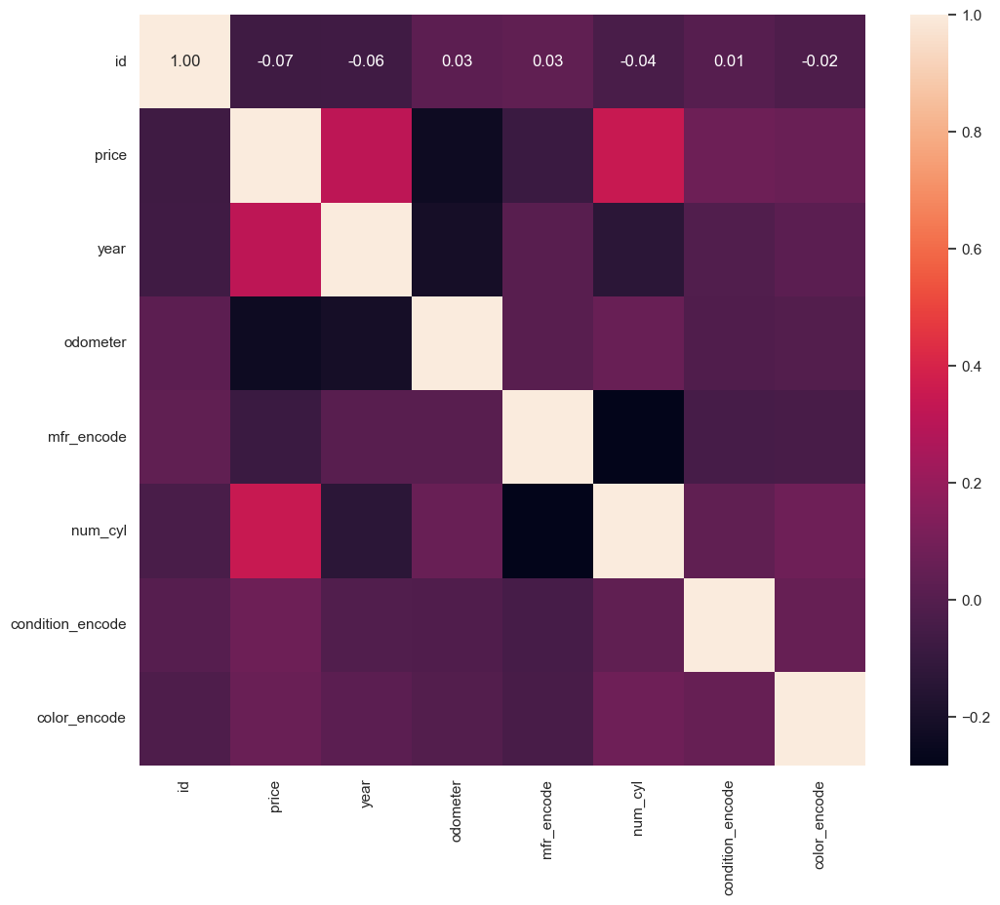

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed

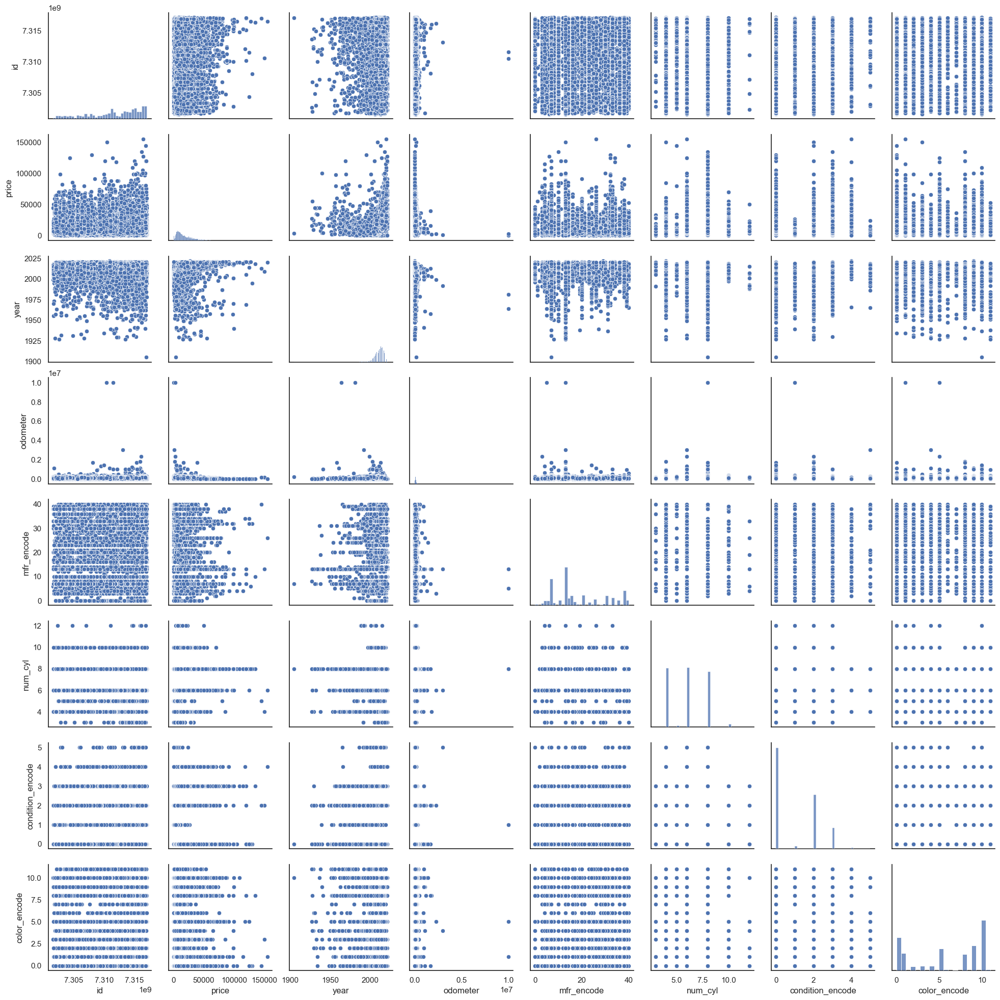

In [123]:
# create the correlation matrix with price
corr_matrix = df_numeric.corr()
corr_matrix['price'].sort_values(ascending=False)

#add the correlation value to each cell in the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f")

plt.show()

# create the pairplot
import seaborn as sns
sns.pairplot(df_numeric)
plt.show()



/opt/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:260: FutureWarning:

Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior



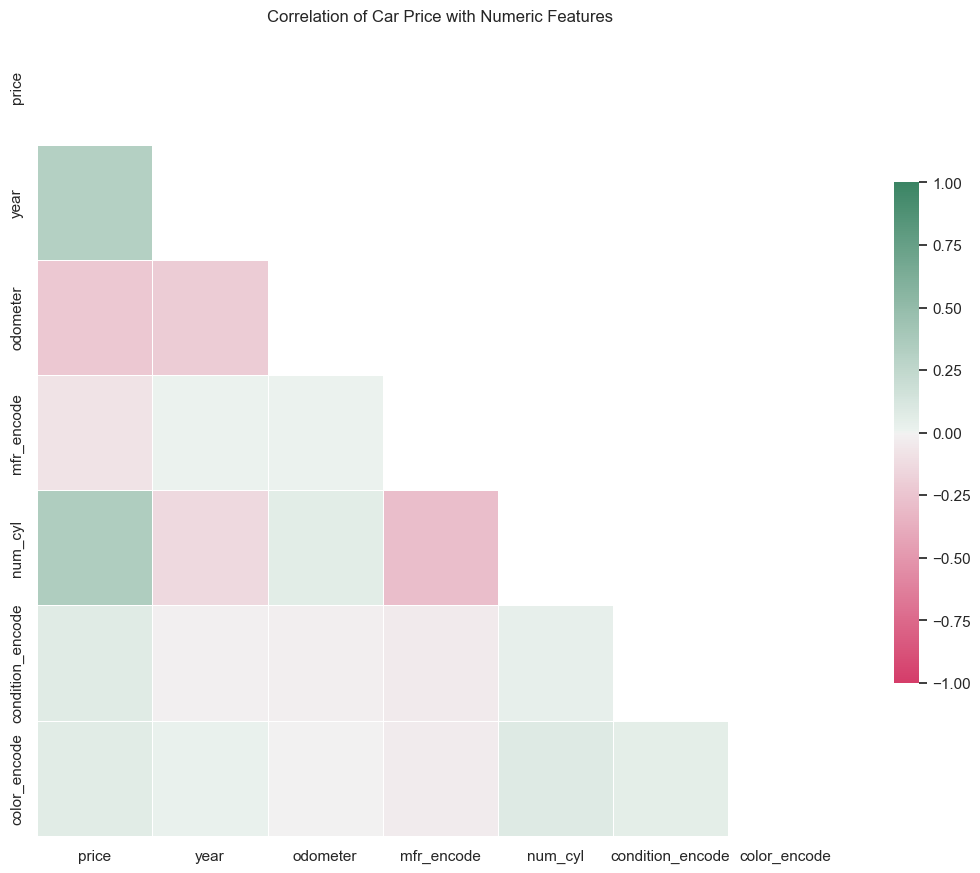

In [124]:
#diagonal heatmap from https://seaborn.pydata.org/examples/many_pairwise_correlations.html
sns.set_theme(style="white")

d = df_numeric.drop('id', axis=1)

# Compute the correlation matrix
corr = d.corr()
corr['price'].sort_values(ascending=False)


# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(13,13))

# generate a custom diverging colormap from dark red to dark green
cmap = sns.diverging_palette(0, 150, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, annot=True, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
            fmt=".2f", square=True, linewidths=.5, cbar_kws={"shrink": .5}, cbar=True)
plt.title('Correlation of Car Price with Numeric Features')
plt.savefig('images/heatmap.jpg')

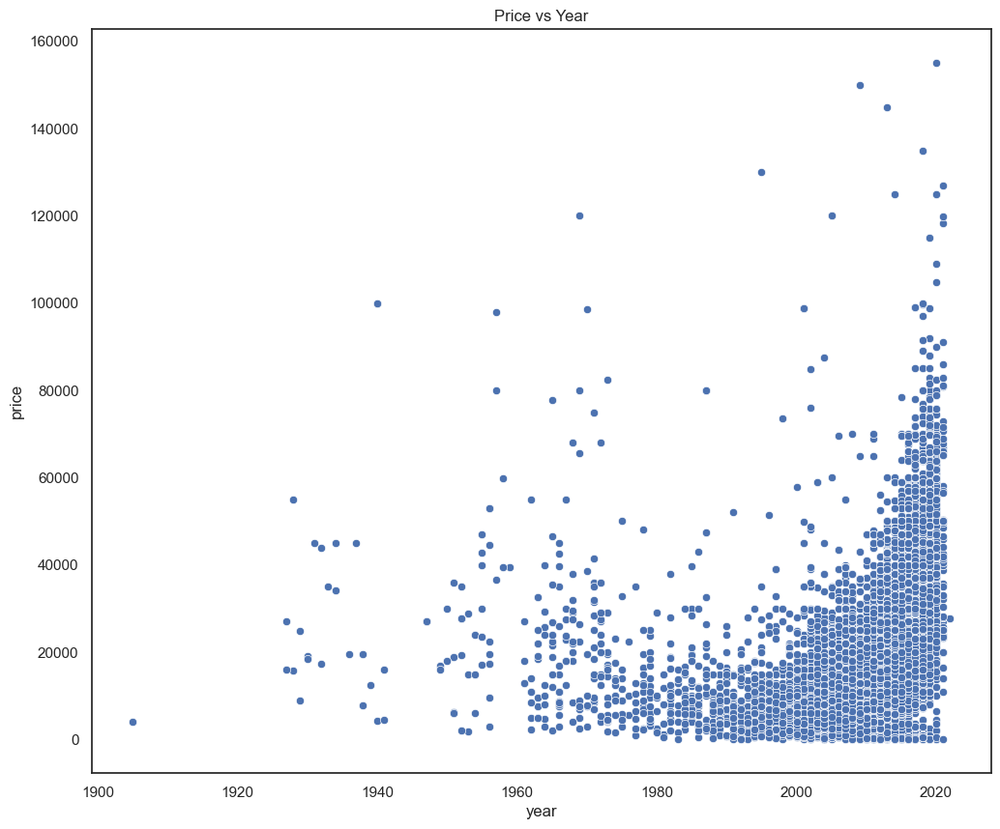

In [125]:
# show the correlation of price with year
plt.figure(figsize=(12, 10))
sns.scatterplot(data=df_nonull, x='year', y='price')
plt.title('Price vs Year')
plt.show()


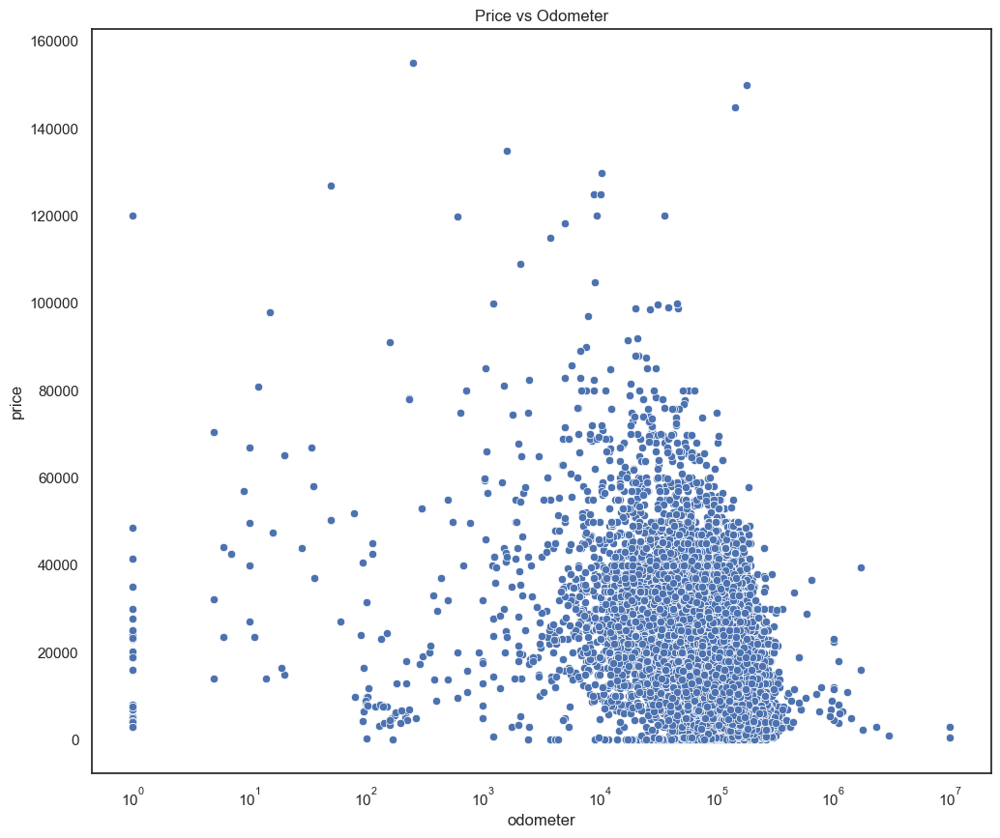

In [126]:
# show the correlation of price with odometer
plt.figure(figsize=(12, 10))
sns.scatterplot(data=df_nonull, x='odometer', y='price')
plt.xscale('log')
plt.title('Price vs Odometer')
plt.show()


/opt/anaconda3/lib/python3.11/site-packages/seaborn/categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



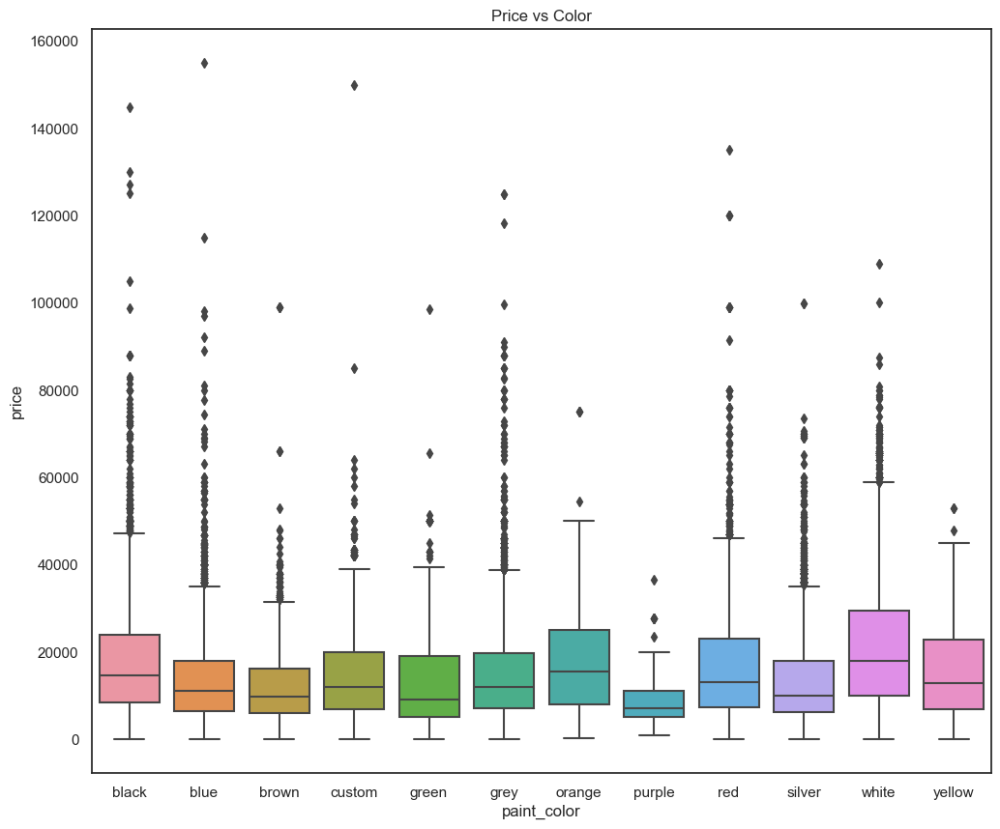

In [127]:
#plot price versus color
plt.figure(figsize=(12, 10))
sns.boxplot(data=df_nonull, x='paint_color', y='price')
plt.title('Price vs Color')
plt.show()


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/49599535.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1057: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1057: FutureWarning:

The default of observed

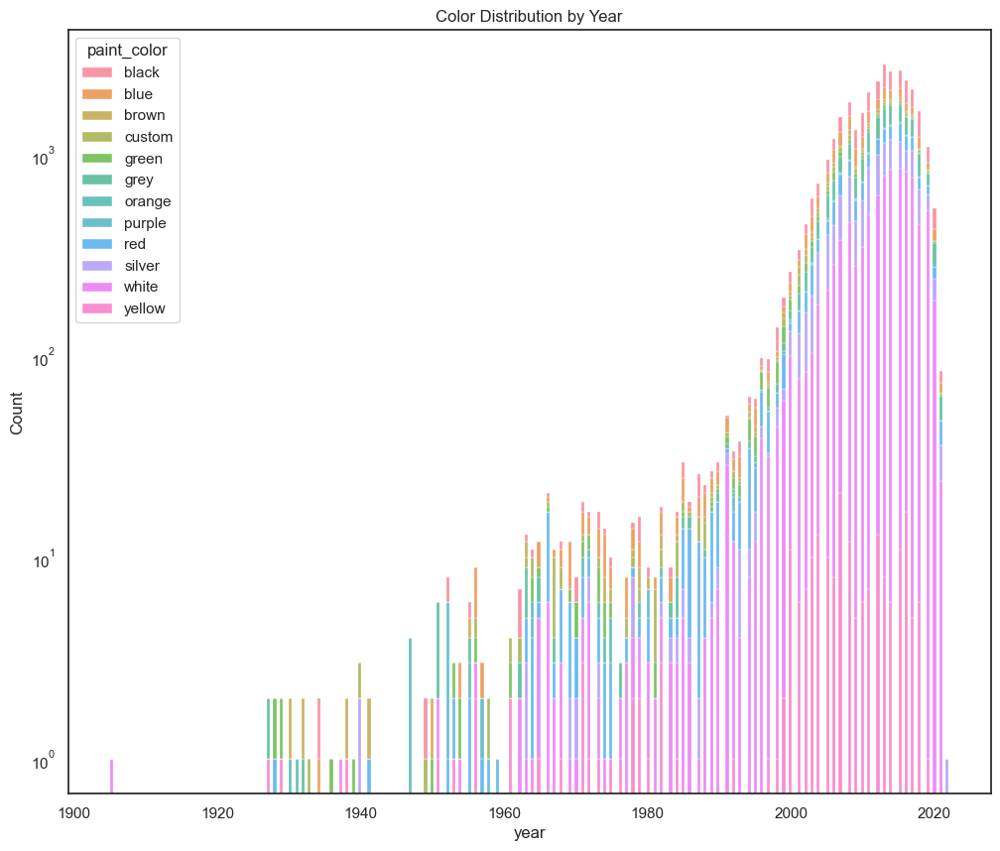

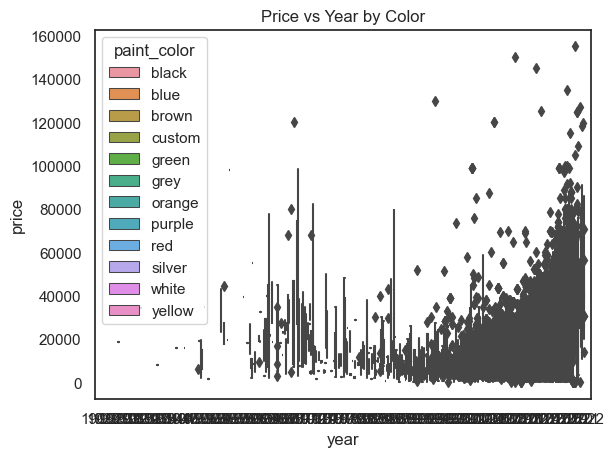

In [128]:
#TODO: NEED TO MAKE THESE COLORS MATCH
#group by 5 year intervals and plot the average price
df_nonull['year_group'] = pd.cut(df_nonull['year'], bins=range(1980, 2025, 5))
plt.figure(figsize=(12, 10))
sns.histplot(data=df_nonull, x='year', hue='paint_color', multiple='stack')
#make the y axis log scale
plt.yscale('log')
plt.title('Color Distribution by Year')
plt.show()

sns.boxplot(data=df_nonull, x='year', y='price', hue='paint_color')
plt.title('Price vs Year by Color')
plt.show()


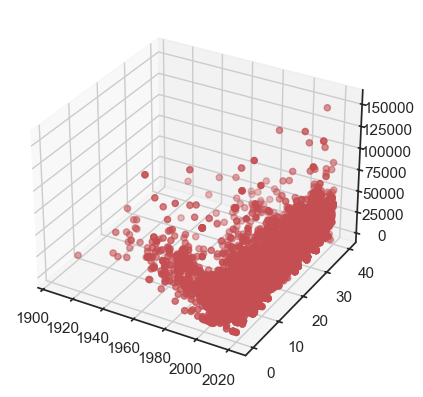

In [129]:
# draw a 3d plot of the price with the year and manufacturer using plotly
import plotly.express as px
fig = px.scatter_3d(df_nonull, x='year', y='mfr_encode', z='price', color='price')
fig.show()

# draw a 3d plot of the price with the year and manufacturer using matplotlib
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

x = df_nonull['year']
y = df_nonull['mfr_encode']
z = df_nonull['price']

ax.scatter(x, y, z, c='r', marker='o')
plt.show()


In [130]:
# show the average price by manufacturer by year
data = df_nonull
fig = px.scatter(x=data['manufacturer'], y = data['price'], color=data['year'])
fig.update_traces(marker=dict(size=12,
                              line=dict(width=2,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers+lines'))
fig.show()



In [131]:
def plots_by_year(data, subtitle):
    fig = px.scatter(x=data['manufacturer'], y = data['price'], color=data['year'])
    fig.update_traces(marker=dict(size=12,
                                  line=dict(width=2,
                                            color='DarkSlateGrey')),
                      selector=dict(mode='markers+lines'))
    #set the title to 'Price by Manufacturer by Year: {subtitle}'
    fig.update_layout(title=f"Price by Manufacturer by Year: {subtitle}")
    fig.show()

    # plot a line graph of the average price by year and manufacturer
    data = data.groupby(['year', 'manufacturer'])['price'].mean().reset_index()
    fig = px.line(data, x='year', y='price', color='manufacturer')
    # set the title to 'Price by Manufacturer by Year: {subtitle}'
    fig.update_layout(title=f"Price by Manufacturer by Year: {subtitle}")
    fig.show()


In [132]:
plots_by_year(df_nonull, 'All Years')

/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/2492672508.py:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



### Conclusions / Hypotheses

Three distinct markets
1. Vintage before around 1980
    a. Specfic brands
    b. high premium on condition / mileage
2. Luxury / Exotic outliers
    a. high end
    b. small numbers
    c. price outliers
3. Mainstream market
    a. high correlation between year, mileage and price
    b. newer == higher
    

In [133]:
# separate the data into before and after 1980
df_1980 = df_nonull[df_nonull['year'] < 1980]
#print the count of rows in the dataset
print(f"Rows before 1980: {df_1980.count().max()}")
plots_by_year(df_1980, 'Before 1980')

df_recent = df_nonull[df_nonull['year'] >= 1980]
#print the count of rows in the dataset
print(f"Rows after 1980: {df_recent.count().max()}")
plots_by_year(df_recent, 'After 1980')

Rows before 1980: 304


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/2492672508.py:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Rows after 1980: 32192


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/2492672508.py:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [134]:

# create a new dataframe with outliers removed from df_recent
df_outliers = df_recent[df_recent['price'] > 50000]
df_core = df_recent[df_recent['price'] <= 50000]

print(f"Outliers: {df_outliers.count().max()}")
plots_by_year(df_outliers, 'Outliers after 1980')

print(f"Core: {df_core.count().max()}")
plots_by_year(df_core, 'Core after 1980')


Outliers: 649


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/2492672508.py:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Core: 31543


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/2492672508.py:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.